In [1]:
# data analysis and EDA analysis
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')


from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif # for the feature selection algorithm
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,classification_report, accuracy_score,confusion_matrix


from sklearn.model_selection import GridSearchCV



In [2]:
file_path = '/Users/muhammadhassaan/Downloads/Predictive Analytics in Hotel Booking Management/data/Hotel Reservations.csv'

In [3]:
df = pd.read_csv(file_path)

In [4]:
# pip install ipywidgets

In [5]:

profile = ProfileReport(df, title="Profiling Report_hotel_reservations")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# variables that are highly imbalanced datapoints
no_of_adults, required_car_parking_space,room_type_reserved,repeated_guest

In [6]:
# pip plotly


# Data Understanding

In [4]:
df

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled


In [5]:
df.columns

Index(['Booking_ID', 'no_of_adults', 'no_of_children', 'no_of_weekend_nights',
       'no_of_week_nights', 'type_of_meal_plan', 'required_car_parking_space',
       'room_type_reserved', 'lead_time', 'arrival_year', 'arrival_month',
       'arrival_date', 'market_segment_type', 'repeated_guest',
       'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled',
       'avg_price_per_room', 'no_of_special_requests', 'booking_status'],
      dtype='object')

In [6]:
df.shape

(36275, 19)

In [7]:
df.dtypes

Booking_ID                               object
no_of_adults                              int64
no_of_children                            int64
no_of_weekend_nights                      int64
no_of_week_nights                         int64
type_of_meal_plan                        object
required_car_parking_space                int64
room_type_reserved                       object
lead_time                                 int64
arrival_year                              int64
arrival_month                             int64
arrival_date                              int64
market_segment_type                      object
repeated_guest                            int64
no_of_previous_cancellations              int64
no_of_previous_bookings_not_canceled      int64
avg_price_per_room                      float64
no_of_special_requests                    int64
booking_status                           object
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

In [9]:
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
categorical_columns = df.select_dtypes(include='object').columns


## Missing values.

In [10]:
missing_vals = df.isnull().sum() /100 
missing_vals

Booking_ID                              0.0
no_of_adults                            0.0
no_of_children                          0.0
no_of_weekend_nights                    0.0
no_of_week_nights                       0.0
type_of_meal_plan                       0.0
required_car_parking_space              0.0
room_type_reserved                      0.0
lead_time                               0.0
arrival_year                            0.0
arrival_month                           0.0
arrival_date                            0.0
market_segment_type                     0.0
repeated_guest                          0.0
no_of_previous_cancellations            0.0
no_of_previous_bookings_not_canceled    0.0
avg_price_per_room                      0.0
no_of_special_requests                  0.0
booking_status                          0.0
dtype: float64

#### the data has no missing values data and now the next step towards the outlier detection 

## Checking the Anomaly detection by different methods

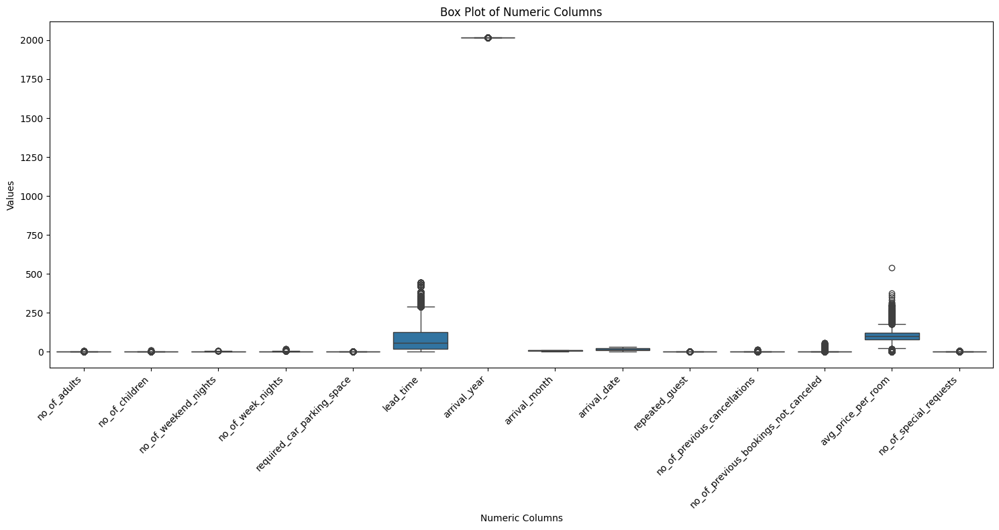

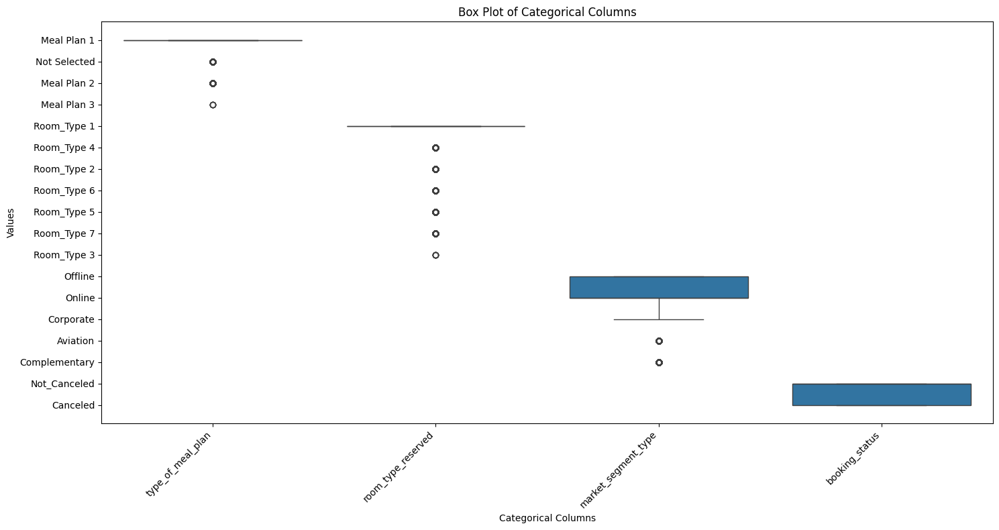

In [11]:
melted_df = pd.melt(df, value_vars=numeric_columns)
# Create a combined box plot
plt.figure(figsize=(15, 8))
sns.boxplot(x='variable', y='value', data=melted_df)
plt.title('Box Plot of Numeric Columns')
plt.xlabel('Numeric Columns')
plt.ylabel('Values')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


categorical_columns = categorical_columns.drop('Booking_ID')

melted_df = pd.melt(df, value_vars=categorical_columns)

# Create a combined box plot
plt.figure(figsize=(15, 8))
sns.boxplot(x='variable', y='value', data=melted_df)
plt.title('Box Plot of Categorical Columns')
plt.xlabel('Categorical Columns')
plt.ylabel('Values')

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Insights
- After plotting the box plot get an overview of the data have not much anomilies
- and not much outliers that would affect the machine learning models 

In [12]:
df.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000
mean,1.844962,0.105279,0.810724,2.204300,0.030986,85.232557,2017.820427,7.423653,15.596995,0.025637,0.023349,0.153411,103.423539,0.619655
std,0.518715,0.402648,0.870644,1.410905,0.173281,85.930817,0.383836,3.069894,8.740447,0.158053,0.368331,1.754171,35.089424,0.786236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,17.000000,2018.000000,5.000000,8.000000,0.000000,0.000000,0.000000,80.300000,0.000000
50%,2.000000,0.000000,1.000000,2.000000,0.000000,57.000000,2018.000000,8.000000,16.000000,0.000000,0.000000,0.000000,99.450000,0.000000
75%,2.000000,0.000000,2.000000,3.000000,0.000000,126.000000,2018.000000,10.000000,23.000000,0.000000,0.000000,0.000000,120.000000,1.000000
max,4.000000,10.000000,7.000000,17.000000,1.000000,443.000000,2018.000000,12.000000,31.000000,1.000000,13.000000,58.000000,540.000000,5.000000


In [16]:
for column in df:
    print("Column"," ",column,"  unique value are :", df[column].nunique())
    print(df[column].unique())
    print("-------------------------")

Column   Booking_ID   unique value are : 36275
['INN00001' 'INN00002' 'INN00003' ... 'INN36273' 'INN36274' 'INN36275']
-------------------------
Column   no_of_adults   unique value are : 5
[2 1 3 0 4]
-------------------------
Column   no_of_children   unique value are : 6
[ 0  2  1  3 10  9]
-------------------------
Column   no_of_weekend_nights   unique value are : 8
[1 2 0 4 3 6 5 7]
-------------------------
Column   no_of_week_nights   unique value are : 18
[ 2  3  1  4  5  0 10  6 11  7 15  9 13  8 14 12 17 16]
-------------------------
Column   type_of_meal_plan   unique value are : 4
['Meal Plan 1' 'Not Selected' 'Meal Plan 2' 'Meal Plan 3']
-------------------------
Column   required_car_parking_space   unique value are : 2
[0 1]
-------------------------
Column   room_type_reserved   unique value are : 7
['Room_Type 1' 'Room_Type 4' 'Room_Type 2' 'Room_Type 6' 'Room_Type 5'
 'Room_Type 7' 'Room_Type 3']
-------------------------
Column   lead_time   unique value are : 352
[

In [17]:
# fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(20, 20))

# columns = df.columns
# index = 0

# for i in range(5):
#     for j in range(3):
#         if index < len(columns):
#             sns.histplot(df[columns[index]], kde=True, ax=axes[i, j])
#             axes[i, j].set_title(columns[index])
#             index += 1

# plt.tight_layout()
# plt.show()

## Multivariate Analysis

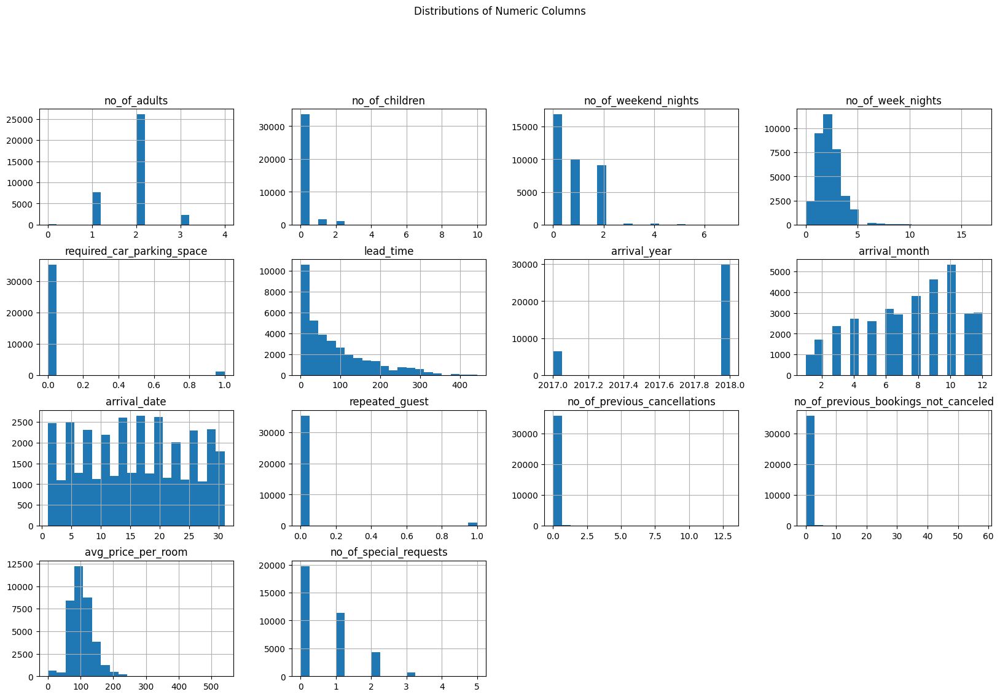

In [13]:
df[numeric_columns].hist(bins=20, figsize=(20, 12))
plt.suptitle('Distributions of Numeric Columns', y=1.02)
plt.show()

### Data Distribution Analysis

### this is my analysis by looking at the distributions of numeric columns (may be different)

1. **no_of_adults:**
   - Skewed distribution, with a majority of bookings involving fewer adults.

2. **no_of_children:**
   - Skewed distribution mostly no_of_children are in the 2- 4 range 

3. **no_of_weekend_nights:**
   - Exhibits an Exponential distribution.Less than 10k people are in the range of that weekend nights.

4. **no_of_week_nights:**
   - Resembles a Poisson Distribution. Tuesday, Wednesday, Thursday are the most common according to the distribution

5. **required_car_parking_space:**
   - Limited information available. More data is needed for a conclusive analysis or consider scaling. Very few have car parking space

6. **lead_time,**
   - Display an Exponential distribution. Most people book the hotel booking Before hours , fewer bookings as the lead time increase

7. **arrival_month, arrival_date,  arrival_year :** 
   - suggests a possible increase or decrease in bookings over the years at the beginning of the year and 
   date varies between the beginning and end of the weekends 


8. **repeated_guest:**
   - Follows an Exponential distribution.

9. **no_of_previous_cancellations:**
   - we can't get any insights all data are on zero 

10. **no_of_previous_bookings_not_canceled:**
    -  we can't get any insights all data are on zero 

11. **avg_price_per_room:**
    - average price is less than 8k and mostly people are staying in the room with less than 8k price

12. **no_of_special_requests:**
    - skewed towards fewer special requests per booking.

---




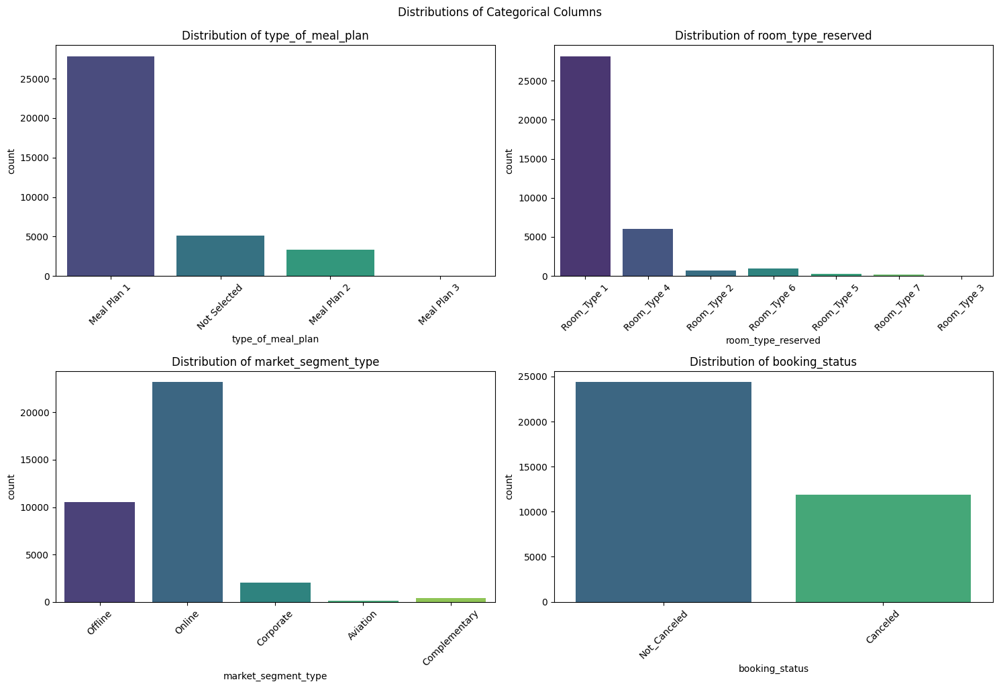

In [14]:
plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(2, len(categorical_columns)//2, i)
    sns.countplot(x=col, data=df, palette='viridis')
    print()
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.suptitle('Distributions of Categorical Columns', y=1.02)
plt.show()

# VariableWise Analysis

##  Relationships between different variables


In [15]:
print(f"Skewness: {df[numeric_columns].skew()}")

Skewness: no_of_adults                            -0.333295
no_of_children                           4.710350
no_of_weekend_nights                     0.737616
no_of_week_nights                        1.599350
required_car_parking_space               5.413643
lead_time                                1.292492
arrival_year                            -1.669695
arrival_month                           -0.348229
arrival_date                             0.028809
repeated_guest                           6.002888
no_of_previous_cancellations            25.199876
no_of_previous_bookings_not_canceled    19.250191
avg_price_per_room                       0.667133
no_of_special_requests                   1.145081
dtype: float64


In [16]:
print(df[numeric_columns].describe())

       no_of_adults  no_of_children  no_of_weekend_nights  no_of_week_nights  \
count  36275.000000    36275.000000          36275.000000       36275.000000   
mean       1.844962        0.105279              0.810724           2.204300   
std        0.518715        0.402648              0.870644           1.410905   
min        0.000000        0.000000              0.000000           0.000000   
25%        2.000000        0.000000              0.000000           1.000000   
50%        2.000000        0.000000              1.000000           2.000000   
75%        2.000000        0.000000              2.000000           3.000000   
max        4.000000       10.000000              7.000000          17.000000   

       required_car_parking_space     lead_time  arrival_year  arrival_month  \
count                36275.000000  36275.000000  36275.000000   36275.000000   
mean                     0.030986     85.232557   2017.820427       7.423653   
std                      0.173281     8

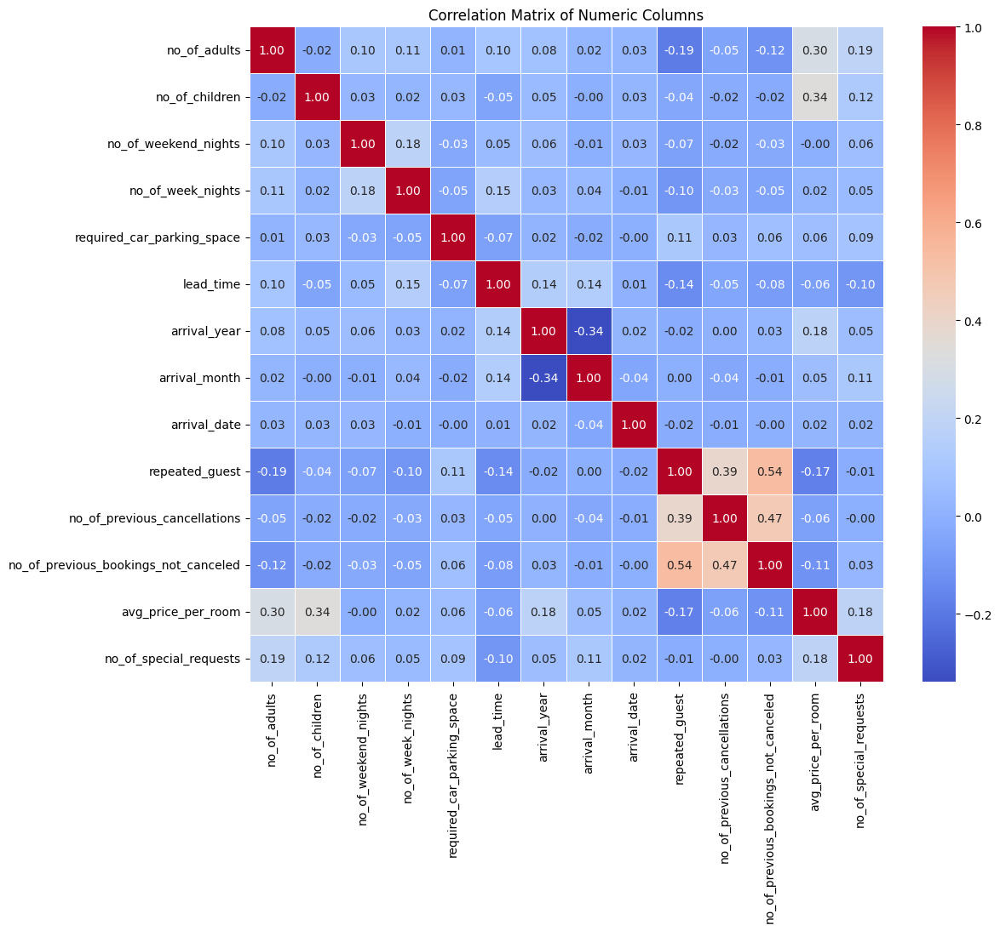

In [17]:
correlation_matrix = df[numeric_columns].corr()

# Create a heatmap for visualization
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Numeric Columns')
plt.show()

- no_of_previous_cancellations_not_canceled , no_of_previous_cancellations and repeated_guest are correlated with each other
  

In [23]:
# One-hot encode categorical columns into numeric
categorical_columns

Index(['type_of_meal_plan', 'room_type_reserved', 'market_segment_type',
       'booking_status'],
      dtype='object')

- we need to check how to apply the min max scaling of the data

- Implement K-nearest neighbors (KNN) and Decision Tree models to predict booking cancellations.

- What are the necessary steps before applying K-nearest neighbors to the data



In [18]:
le = LabelEncoder()
df['Booking_ID_encoded'] = le.fit_transform(df['Booking_ID'])

# label encode type_of_meal_plan
df['type_of_meal_plan_encoded'] = le.fit_transform(df['type_of_meal_plan'])

# label encode room_type_reserved
df['room_type_reserved_encoded'] = le.fit_transform(df['room_type_reserved'])

# label encode market_segment_type
df['market_segment_type_encoded'] = le.fit_transform(df['market_segment_type'])

# label encode booking_status
df['booking_status_encoded'] = le.fit_transform(df['booking_status'])


In [19]:
# Remove the original categorical columns from the encoded dataset
categorical_columns = ['Booking_ID', 'type_of_meal_plan', 'room_type_reserved', 'market_segment_type', 'booking_status']
df_encoded = df.drop(categorical_columns, axis=1)
df_encoded.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,Booking_ID_encoded,type_of_meal_plan_encoded,room_type_reserved_encoded,market_segment_type_encoded,booking_status_encoded
0,2,0,1,2,0,224,2017,10,2,0,0,0,65.00,0,0,0,0,3,1
1,2,0,2,3,0,5,2018,11,6,0,0,0,106.68,1,1,3,0,4,1
2,1,0,2,1,0,1,2018,2,28,0,0,0,60.00,0,2,0,0,4,0
3,2,0,0,2,0,211,2018,5,20,0,0,0,100.00,0,3,0,0,4,0
4,2,0,1,1,0,48,2018,4,11,0,0,0,94.50,0,4,3,0,4,0


In [26]:
# save the encoded dataset into a csv file
df_encoded.to_csv('hotel_booking_encoded.csv', index=False)

In [20]:
# df.head(3)
df_encoded.head(4)

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,Booking_ID_encoded,type_of_meal_plan_encoded,room_type_reserved_encoded,market_segment_type_encoded,booking_status_encoded
0,2,0,1,2,0,224,2017,10,2,0,0,0,65.00,0,0,0,0,3,1
1,2,0,2,3,0,5,2018,11,6,0,0,0,106.68,1,1,3,0,4,1
2,1,0,2,1,0,1,2018,2,28,0,0,0,60.00,0,2,0,0,4,0
3,2,0,0,2,0,211,2018,5,20,0,0,0,100.00,0,3,0,0,4,0


## Correlation_matrix  after the Encoding Technique

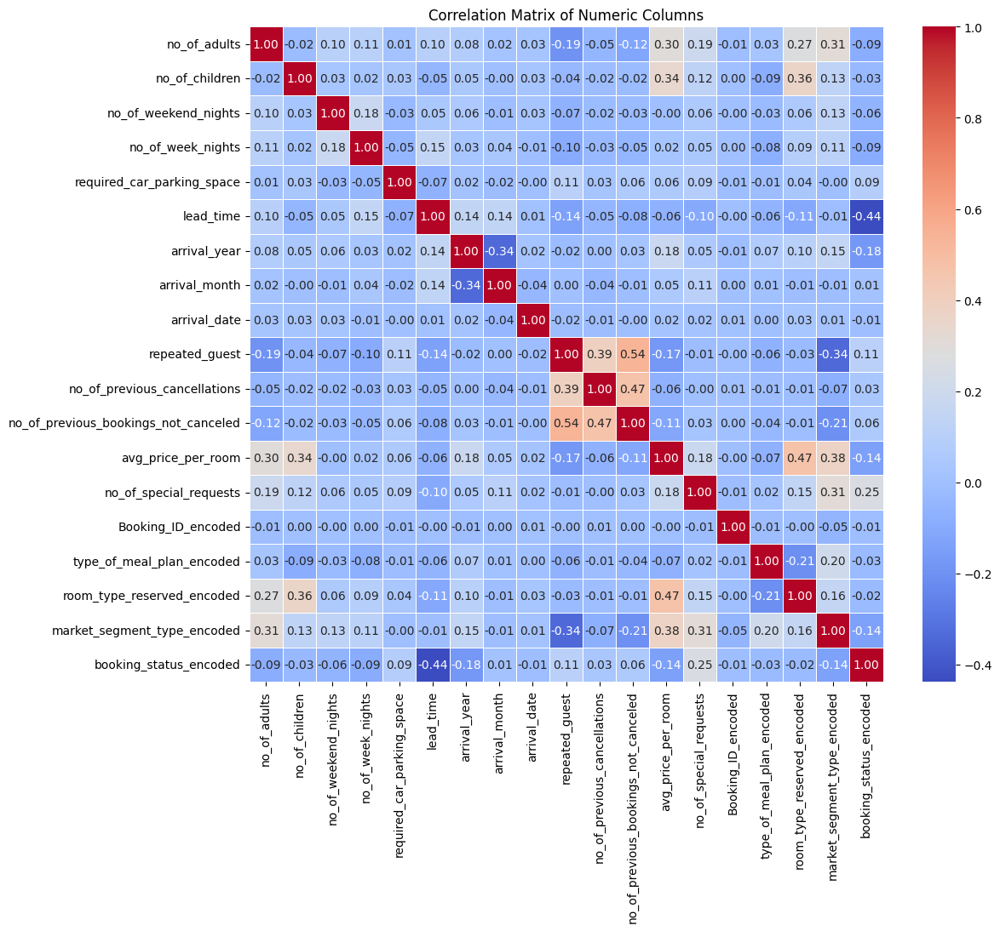

In [21]:
correlation_matrix = df_encoded.corr()

# Create a heatmap for visualization
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Numeric Columns')
plt.show()

### Correlation Analysis

#### 1. Repeated Guests:
- The feature 'repeated_guest' exhibits a positive correlation with 'no_of_previous_bookings_not_canceled' and a moderate positive correlation with 'no_of_previous_cancellations'. This suggests that repeated guests tend not to cancel previous bookings.

#### 2. Average Price per Room:
- 'avg_price_per_room' demonstrates a moderate positive correlation with 'no_of_adults' and 'no_of_children'. This hints that rooms booked for more people tend to be more expensive.

#### 3. Lead Time:
- 'lead_time' displays a negative correlation with several variables such as 'no_of_special_requests', 'required_car_parking_space', and 'repeated_guest'. Longer lead times seem associated with fewer special requests, less need for parking, and fewer repeated guests.

#### 4. Adults and Special Requests:
- 'no_of_adults' and 'no_of_special_requests' exhibit a positive correlation, suggesting that bookings involving more adults tend to have more special requests.

#### 5. Booking Details:
- There are correlations between booking details like 'no_of_weekend_nights', 'no_of_week_nights', and 'avg_price_per_room'. These correlations are expected in hotel reservation data.

**Note:** Always consider the context of your analysis and the specific requirements of your modeling approach.


## Predictive Modeling KNN and Decision Tree 


#### Split Data:
- Split your dataset into training and testing sets. This helps you evaluate the model's performance on unseen data.

In [28]:
print(len(df_encoded.columns))


19


In [29]:
X = df_encoded.drop('booking_status_encoded', axis=1)  # Exclude the target variable
y = df_encoded['booking_status_encoded']


In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

# Display the shapes of the resulting sets
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (29020, 18)
X_test shape: (7255, 18)
y_train shape: (29020,)
y_test shape: (7255,)


In [31]:
# with ANOVA F-statistic for feature selection
X_selected = SelectKBest(f_classif, k=10).fit_transform(X, y) 

In [32]:

knn = KNeighborsClassifier(n_neighbors=7, metric='euclidean')
knn.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=7)

In [33]:
y_pred = knn.predict(X_test)
y_pred

array([1, 1, 1, ..., 1, 1, 1])

In [34]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.7313576843556168


without Scaling the accuracy is 73.1 percent

In [35]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [40]:
knn = KNeighborsClassifier(n_neighbors=7, metric='euclidean')
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)
confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.7313576843556168


I applied hte StandardScaler to the training data the accuracy is 0.81 improved somewhat

In [41]:

import numpy as np

# Splitting the dataset into features and target variable

X = df_encoded.drop('booking_status_encoded', axis=1)  # Exclude the target variable
y = df_encoded['booking_status_encoded']


# Splitting the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Function to apply KNN and evaluate
def evaluate_knn(n_neighbors, metric, X_train, y_train, X_test, y_test):
    knn = KNeighborsClassifier(n_neighbors=n_neighbors, metric=metric)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    return accuracy, report

# Applying KNN with Euclidean distance
euclidean_accuracy, euclidean_report = evaluate_knn(9, 'euclidean', X_train_scaled, y_train, X_test_scaled, y_test)

# Applying KNN with Manhattan distance
manhattan_accuracy, manhattan_report = evaluate_knn(9, 'manhattan', X_train_scaled, y_train, X_test_scaled, y_test)

# Output the results
print("Euclidean Accuracy:", euclidean_accuracy)
print("Euclidean Report:\n", euclidean_report)
print('________________________________________________________________________________________________________________________________')
print("Manhattan Accuracy:", manhattan_accuracy)
print("Manhattan Report:\n", manhattan_report)


Euclidean Accuracy: 0.8407994486560992
Euclidean Report:
               precision    recall  f1-score   support

           0       0.79      0.71      0.75      2416
           1       0.86      0.90      0.88      4839

    accuracy                           0.84      7255
   macro avg       0.83      0.81      0.82      7255
weighted avg       0.84      0.84      0.84      7255

________________________________________________________________________________________________________________________________
Manhattan Accuracy: 0.8516884906960717
Manhattan Report:
               precision    recall  f1-score   support

           0       0.81      0.73      0.77      2416
           1       0.87      0.91      0.89      4839

    accuracy                           0.85      7255
   macro avg       0.84      0.82      0.83      7255
weighted avg       0.85      0.85      0.85      7255



## fine-tune  models to achieve the best performance.
- Hyperparameters in this knn model are K is the parameter
- Cross-Validation (spliting the data into training and validation)
- Evaluation Metrics: in this Classification problem I use accuracy ,F1, recall, precision,weighted avg
- Adjust parameters and repeat the process

In [42]:
from sklearn.metrics import make_scorer

param_grid = {'n_neighbors': [3, 5, 7, 9], 'metric': ['euclidean', 'manhattan']}


# Create KNN model
knn_model = KNeighborsClassifier()

# Define evaluation metrics
scoring = {'accuracy': make_scorer(accuracy_score),
           'precision': 'precision_weighted',
           'recall': 'recall_weighted',
           'f1': 'f1_weighted'}

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(knn_model, param_grid, cv=5, scoring=scoring, refit='accuracy')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Evaluate the model with the best hyperparameters
best_knn_model = grid_search.best_estimator_
y_pred = best_knn_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

Best Hyperparameters: {'metric': 'manhattan', 'n_neighbors': 9}


OKay mahattan distance is a good metic for the distance .. and k vale is 9 

Minimum error:- 0.24700206753962783 at K = 37


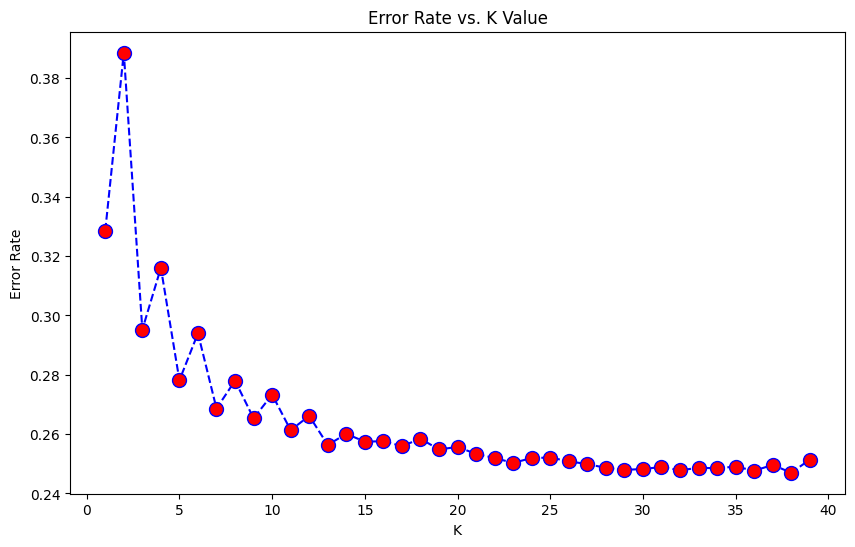

In [50]:
error_rate = []
for i in range(1,40):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed',
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

Maximum accuracy:- 0.7529979324603722 at K = 37


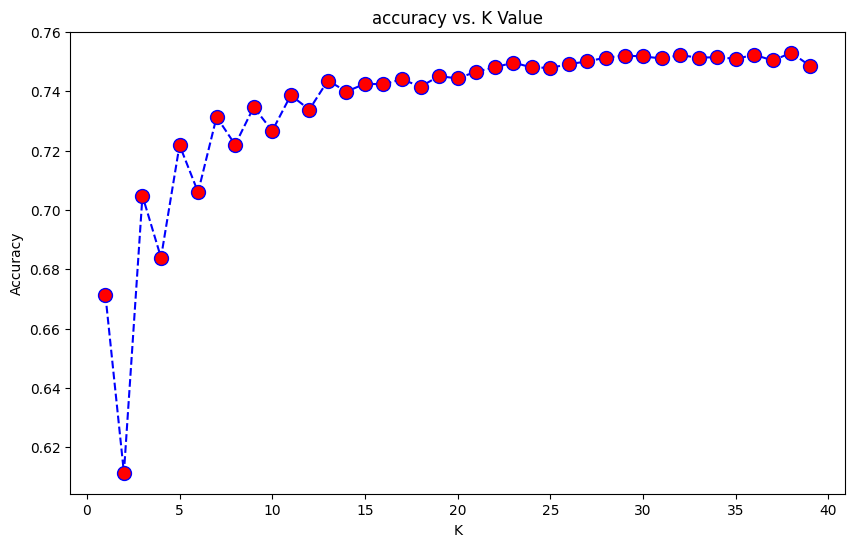

In [51]:
acc = []
# Will take some time
from sklearn import metrics
for i in range(1,40):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, yhat))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),acc,color = 'blue',linestyle='dashed',
         marker='o',markerfacecolor='red', markersize=10)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')
print("Maximum accuracy:-",max(acc),"at K =",acc.index(max(acc)))

In [43]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Assuming you have your dataset loaded into X (features) and y (target variable)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Decision Tree model
decision_tree_model = DecisionTreeClassifier(random_state=42)

# Train the model
decision_tree_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = decision_tree_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", report)


Accuracy: 0.8515506547208822
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.79      0.78      2416
           1       0.89      0.88      0.89      4839

    accuracy                           0.85      7255
   macro avg       0.83      0.84      0.83      7255
weighted avg       0.85      0.85      0.85      7255



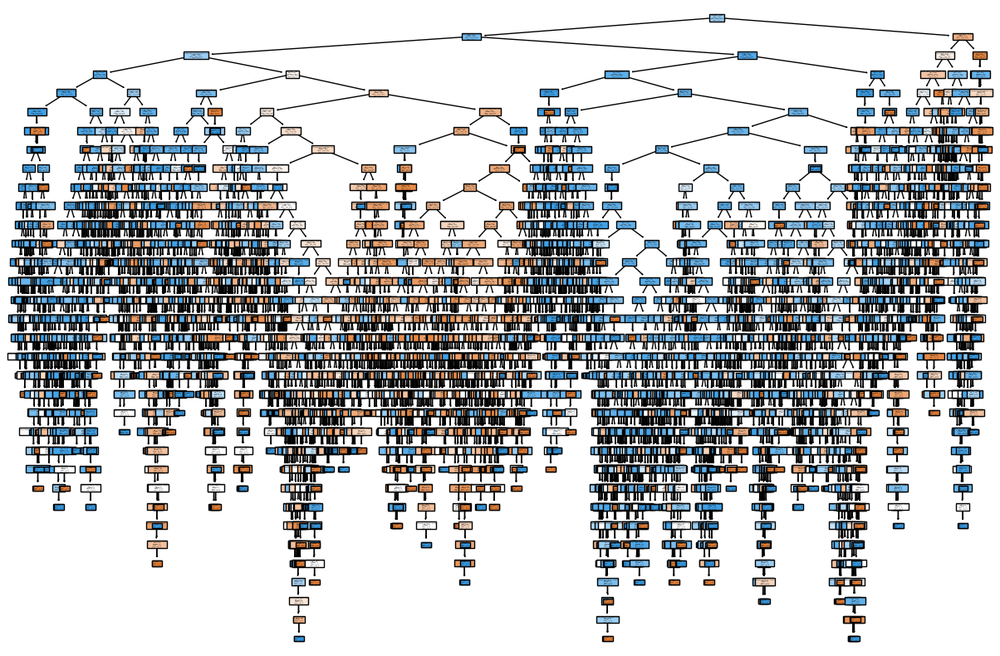

In [54]:
# Import necessary libraries
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

# Assuming you have your dataset loaded into X (features) and y (target variable)

# Create a Decision Tree model
decision_tree_model = DecisionTreeClassifier(random_state=42)

# Train the model
decision_tree_model.fit(X, y)  # Use the entire dataset for simplicity

# Plot the Decision Tree
plt.figure(figsize=(15, 10))
plot_tree(decision_tree_model, filled=True, feature_names=X.columns,class_names=['Booking Not Canceled', 'Booking Canceled'], rounded=True) # class_0', 'class_1
plt.show()

In [56]:
!pip install -U imbalanced-learn



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.6/235.6 kB 1.6 MB/s eta 0:00:00a 0:00:01


In [57]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE

# Assuming you have your dataset loaded into X (features) and y (target variable)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Create a Decision Tree model
decision_tree_model = DecisionTreeClassifier(random_state=42)

# Train the model on the resampled data
decision_tree_model.fit(X_resampled, y_resampled)

# Make predictions on the test set
y_pred = decision_tree_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Decision Tree with SMOTE:")
print("Accuracy:", accuracy)
print("Classification Report:\n", report)


Decision Tree with SMOTE:
Accuracy: 0.8463128876636802
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.81      0.78      2416
           1       0.90      0.86      0.88      4839

    accuracy                           0.85      7255
   macro avg       0.82      0.84      0.83      7255
weighted avg       0.85      0.85      0.85      7255



In [58]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE

# Assuming you have your dataset loaded into X (features) and y (target variable)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Create a KNN model
knn_model = KNeighborsClassifier()

# Train the model on the resampled data
knn_model.fit(X_resampled, y_resampled)

# Make predictions on the test set
y_pred = knn_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("KNN with SMOTE:")
print("Accuracy:", accuracy)
print("Classification Report:\n", report)


KNN with SMOTE:
Accuracy: 0.6635423845623708
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.63      0.55      2416
           1       0.79      0.68      0.73      4839

    accuracy                           0.66      7255
   macro avg       0.64      0.65      0.64      7255
weighted avg       0.69      0.66      0.67      7255



In [59]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE

# Assuming X_resampled and y_resampled from the previous SMOTE step

# Define the pipeline with SMOTE and KNN
pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('knn', KNeighborsClassifier())
])

# Define the hyperparameter grid for KNN
param_grid = {
    'knn__n_neighbors': [8,9,10,12],
    'knn__metric': ['euclidean', 'manhattan']
}

# Perform GridSearchCV
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Train the model with the best parameters on the resampled data
best_knn_model = grid_search.best_estimator_
best_knn_model.fit(X_resampled, y_resampled)

# Make predictions on the test set
y_pred = best_knn_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Best KNN Model with SMOTE:")
print("Best Hyperparameters:", best_params)
print("Accuracy:", accuracy)
print("Classification Report:\n", report)


Best KNN Model with SMOTE:
Best Hyperparameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 9}
Accuracy: 0.6696071674707098
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.64      0.56      2416
           1       0.79      0.68      0.73      4839

    accuracy                           0.67      7255
   macro avg       0.65      0.66      0.65      7255
weighted avg       0.70      0.67      0.68      7255



In [60]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
from sklearn.tree import DecisionTreeClassifier

# Assuming X_resampled and y_resampled from the SMOTE step

# Create and train the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_resampled, y_resampled)

# Make predictions on the test set
y_pred_dt = dt_model.predict(X_test)

# Evaluate the model with multiple metrics
accuracy_dt = accuracy_score(y_test, y_pred_dt)
precision_dt = precision_score(y_test, y_pred_dt)
recall_dt = recall_score(y_test, y_pred_dt)
f1_dt = f1_score(y_test, y_pred_dt)
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)

# Get feature importances
feature_importances = dt_model.feature_importances_

print("Decision Tree Model:")
print("Accuracy:", accuracy_dt)
print("Precision:", precision_dt)
print("Recall:", recall_dt)
print("F1-Score:", f1_dt)
print("Confusion Matrix:\n", conf_matrix_dt)
print("Feature Importances:\n", feature_importances)


Decision Tree Model:
Accuracy: 0.8463128876636802
Precision: 0.9019861830742659
Recall: 0.8634015292415789
F1-Score: 0.88227219934537
Confusion Matrix:
 [[1962  454]
 [ 661 4178]]
Feature Importances:
 [2.17933347e-02 4.38470813e-03 2.77363837e-02 3.17739648e-02
 7.14156786e-03 3.09528150e-01 1.42064272e-02 7.32385911e-02
 5.48238965e-02 1.94974400e-03 3.37660555e-04 2.93676368e-04
 1.29256496e-01 1.26209034e-01 8.96064308e-02 1.36312409e-02
 1.46607586e-02 7.94279353e-02]


## ## Evaluation Metrics after SMOTE

## Training KNN Algorithm:

#### Feature Selection:
If needed, perform feature selection to choose relevant features for training the model.
####Train KNN Model:
Use the training data to train the KNN model. Choose an appropriate value for 
k
k (number of neighbors).
#### Evaluate Model:
Use the testing set to evaluate the performance of the trained KNN model. Common metrics include accuracy, precision, recall, or F1-score for classification tasks.

## Training Decision Tree Algorithm:
#### Split Data:
Same as above, split your dataset into training and testing sets.
#### Feature Selection:
If needed, perform feature selection. Decision trees automatically perform feature selection based on information gain or Gini impurity.
Train Decision Tree Model:
Use the training data to train the Decision Tree model.
Evaluate Model:
Use the testing set to evaluate the performance of the trained Decision Tree model. Metrics can include accuracy or mean squared error for regression tasks.
#### General Tips:
#### Hyperparameter Tuning:
Experiment with different hyperparameter values for both KNN and Decision Tree to find the optimal configuration.
#### Cross-Validation:
Consider using cross-validation to get a more robust estimate of your models' performance.
#### Model Comparison:
Compare the performance of both algorithms to see which one performs better for your specific task.
Remember, the effectiveness of these steps depends on the nature of your data and the problem you are trying to solve. Adjust the steps based on your specific requirements.